# Load original image and convert to rgb/grayscale

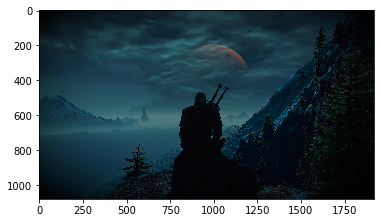

In [1]:
%matplotlib inline
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt

color_image = cv2.imread('witcher.png',1) #Read color image
rgb_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB) #convert to matplotlib interpretable color scheme
gray_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2GRAY)
plt.imshow(rgb_image)
plt.show()

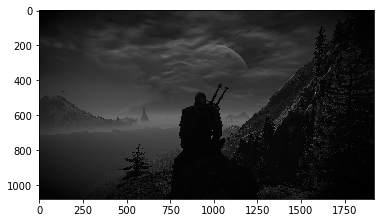

In [2]:
#Show Grayscale image
plt.imshow(gray_image, cmap='gray', vmin=0, vmax=255)
plt.show()

# Define some utility functions functions

In [3]:
def show_hist(img, label='hist'):
    '''
        Assumes grayscale or rgb image.
        Generates matplotlib histogram and shows it
    '''
    channels = img.shape
    if len(channels) == 2:
        plt.hist(img.ravel(),256,[0,256], label=label)
    elif len(channels) == 3 and channels[-1] == 3:
        bgr_img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        color = ('b','g','r')
        for i,col in enumerate(color):
            histr = cv2.calcHist([img],[i],None,[256],[0,256])
            plt.plot(histr,color = col, label=col)
            plt.xlim([0,256])
    plt.legend(loc=1)
    plt.show()
        
def stretch(img):
    '''
        strecths a grayscale image in place
    '''
    i_max = np.amax(img)
    i_min = np.amin(img)
    m = 255 / (i_max-i_min)
    c = 0

    fx = lambda x: m*x+c

    for row in img:
        for i, pixel_color in enumerate(row):
            row[i] = fx(pixel_color)

def draw_cdf(img, loc=4):
    '''
        plots cdf of image
        expects grayscale or rgb image
    '''
    channels = img.shape
    if len(channels) == 2: #image is grayscale
        cdf = get_cdf(img)
        plt.plot(cdf, color = 'k', label='cdf')
    elif len(channels) == 3 and channels[-1] == 3: #image is rgb
        color = ('r','g','b')
        for i,col in enumerate(color):
            cdf = get_cdf(img[:,:,i])
            plt.plot(cdf,color = col, label=col)
            plt.xlim([0,256])
    plt.legend(loc=loc)
    plt.show()

def get_cdf(img):
    '''
        expects single channel image, returns cdf array
    '''
    hist,bins = np.histogram(img.flatten(),256,[0,256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max()/ cdf.max()
    return cdf_normalized

# Perform image stretching enhancment strategy to grayscale image

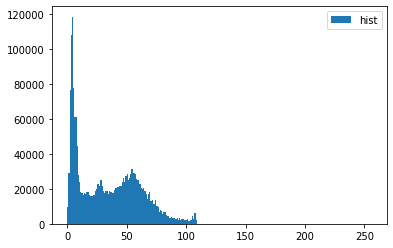

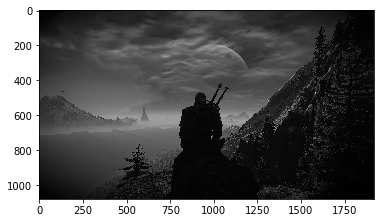

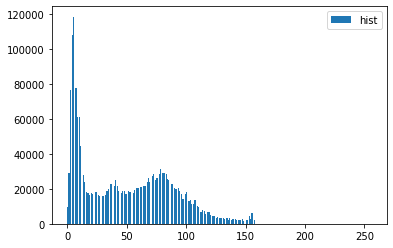

In [4]:
#make a copy of grayscale image
gray_copy = gray_image.copy() #copy image
show_hist(gray_copy)

#stretch copy in place
stretch(gray_copy)
plt.imshow(gray_copy, cmap='gray', vmin=0, vmax=255)
plt.show()

#show resulting histogram
show_hist(gray_copy)

stretched_grayscale = gray_copy #for later comparison

# Perform image stretching enhancment strategy to RGB image

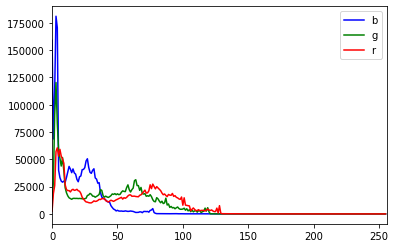

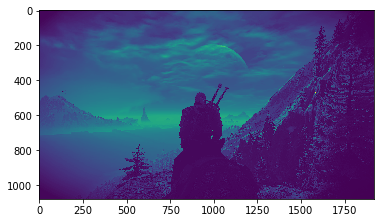

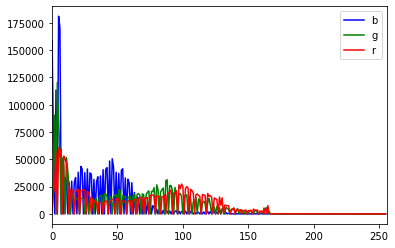

In [5]:
#Strech RGB image
rgb_copy = rgb_image.copy()
show_hist(rgb_copy)

#seperate channels
r, g, b = rgb_copy[:,:,0], rgb_copy[:,:,1], rgb_copy[:,:,2]

stretch(r)
stretch(g)
stretch(b)

#combine channels
rgb_copy = np.dstack((r,g,b))
plt.imshow(gray_copy)
plt.show()
show_hist(rgb_copy)

stretched_rgb = rgb_copy #for later comparison

# Perform histogram equilization enhancment strategy to grayscale image

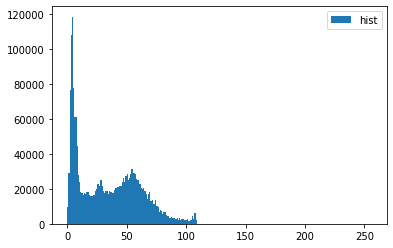

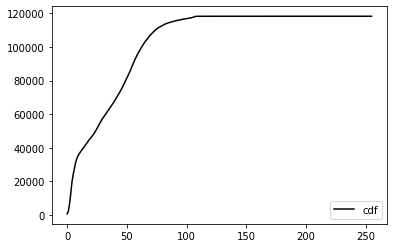

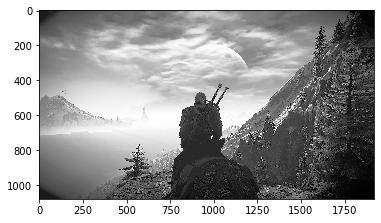

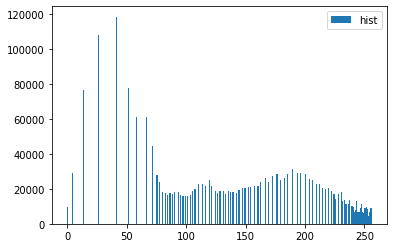

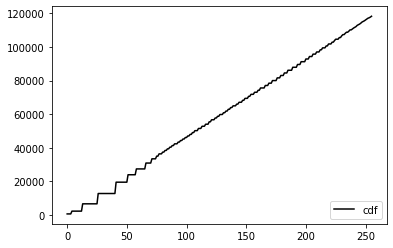

In [6]:
#Perform histogram equilization
gray_copy = gray_image.copy()
show_hist(gray_copy)
draw_cdf(gray_copy)

gray_copy = cv2.equalizeHist(gray_image.copy())
plt.imshow(gray_copy, cmap='gray', vmin=0, vmax=255)
plt.show()

#show results of histogram equilization
show_hist(gray_copy)
draw_cdf(gray_copy)

equ_gray = gray_copy #for later comparison

# Perform histogram equilization enhancment strategy to RGB image

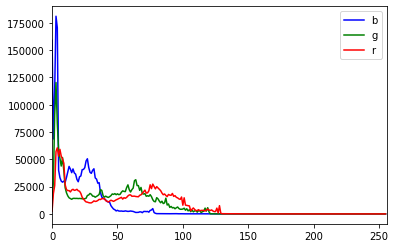

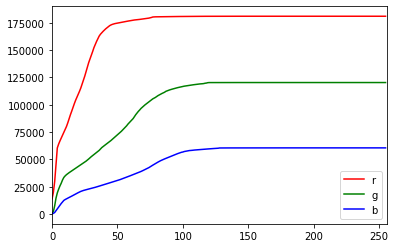

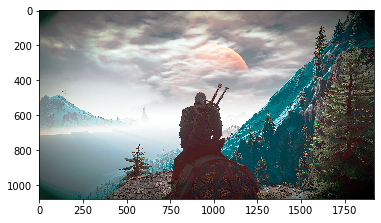

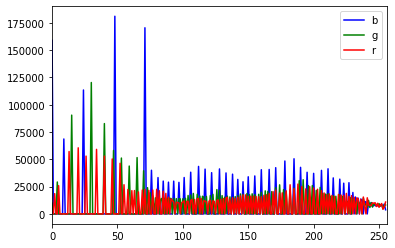

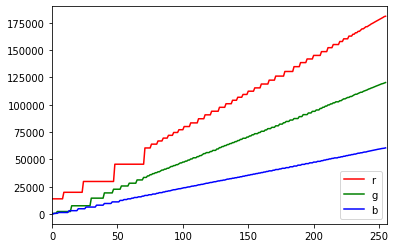

In [7]:
#perform histogram equilization on rgb image
rgb_copy = rgb_image.copy()
show_hist(rgb_copy)
draw_cdf(rgb_copy)

#seperate channels
r, g, b = rgb_copy[:,:,0], rgb_copy[:,:,1], rgb_copy[:,:,2]

#perform equilization on each channel
r = cv2.equalizeHist(r.copy())
g = cv2.equalizeHist(g.copy())
b = cv2.equalizeHist(b.copy())
rgb_copy = np.dstack((r,g,b))
plt.imshow(rgb_copy)
plt.show()

#show results of histogram equilization
show_hist(rgb_copy)
draw_cdf(rgb_copy)

equ_rgb = rgb_copy #for later comparison

# Add and remove noise using median blur

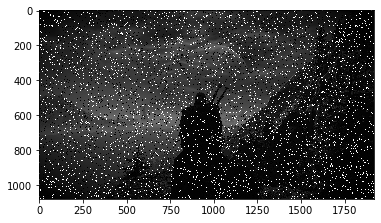

In [8]:
def sp_noise(image,prob):
    '''
    Add salt and pepper noise to image
    prob: Probability of the noise
    '''
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < prob:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

#add noise to image
noise_img = sp_noise(gray_image.copy(),0.05)
plt.imshow(noise_img, cmap='gray', vmin=0, vmax=255)
plt.show()

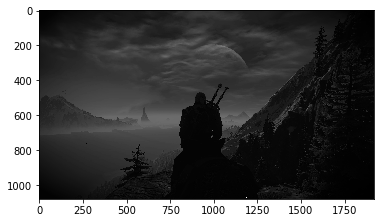

In [9]:
#remove noise
filtered = cv2.medianBlur(noise_img, 3)
plt.imshow(filtered, cmap='gray', vmin=0, vmax=255)
plt.show()

# Results

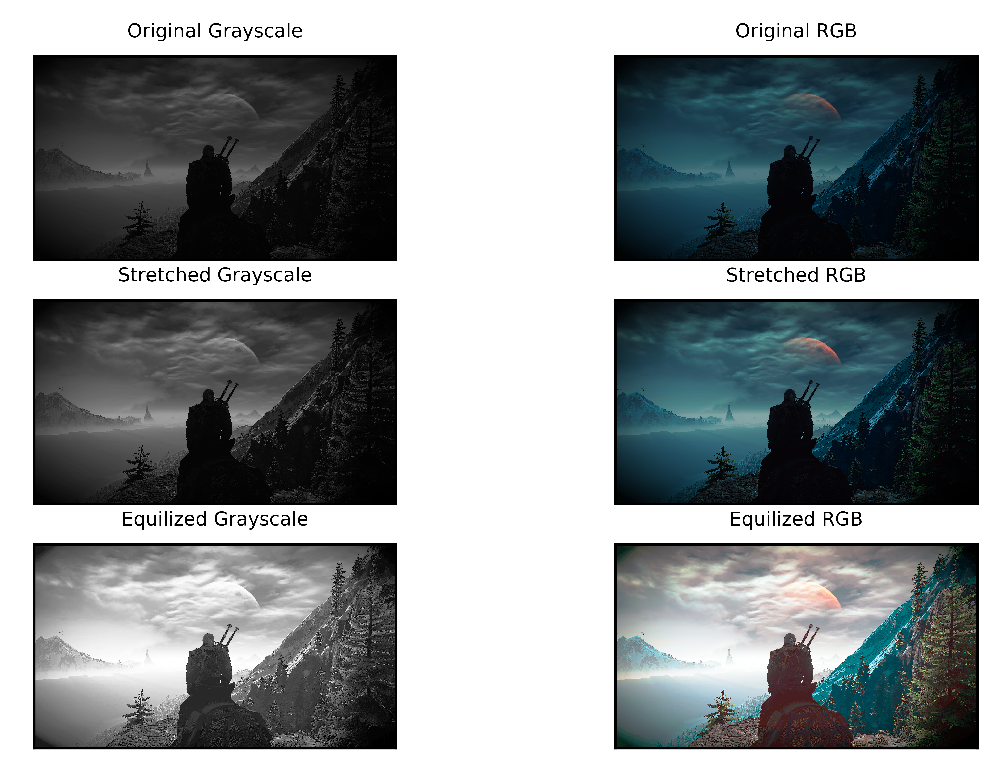

In [10]:
#Show comparisons
titles = ['Original Grayscale', 'Original RGB', 'Stretched Grayscale', 'Stretched RGB', 'Equilized Grayscale', 'Equilized RGB']
images = [gray_image, rgb_image, stretched_grayscale, stretched_rgb, equ_gray, equ_rgb]

#set subplot resolution and title size
plt.figure(dpi=1200)
fontdict = {'fontsize':6}

for i, img in enumerate(images):
    plt.subplot(3,2,i+1)
    if i % 2 == 0:
        plt.imshow(img, cmap='gray', vmin=0, vmax=255) #if grayscale
    else:
        plt.imshow(np.uint8(img))
    plt.xticks([]), plt.yticks([])
    plt.title(titles[i], fontdict), plt.xticks([]), plt.yticks([])
plt.show()